# Bayesian Ridge Regression - Technical Indicators

# References 

* http://www.machinelearning.org/proceedings/icml2004/papers/354.pdf
* http://blog.applied.ai/bayesian-inference-with-pymc3-part-2/

In [1]:
%matplotlib inline

%load_ext autoreload
%autoreload 2

%load_ext version_information
%version_information matplotlib, numpy, pandas, pymc3, seaborn, sklearn

Software versions
Python 3.5.1 64bit [GCC 4.4.7 20120313 (Red Hat 4.4.7-1)]
IPython 4.1.2
OS Linux 3.13.0 86 generic x86_64 with debian jessie sid
matplotlib 1.5.1
numpy 1.10.4
pandas 0.18.0
pymc3 3.0
seaborn 0.7.0
sklearn 0.17.1
Wed May 25 10:00:19 2016 BST

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.plotly as py
import plotly.graph_objs as go 
import pymc3 as pm
import random
import seaborn as sns
from sklearn import preprocessing as preproc
from sklearn.linear_model import BayesianRidge
from sklearn.metrics import mean_squared_error as mse, accuracy_score as acc_scr, mean_absolute_error as mae

np.set_printoptions(threshold=np.nan)
sns.set()

In [3]:
def directional_symmetry(act, pred):
    act_ticks = list(map(lambda x: 1 if x >= 0 else 0, act.values))
    pred_ticks = list(map(lambda x: 1 if x >= 0 else 0, pred))
    d = list(map(lambda t: t[0] == t[1], zip(act_ticks, pred_ticks)))
    
    return np.sum(d) / len(act_ticks)

In [4]:
path = '../btc-data/BTC_LOB_techind_10s.csv'
data10s = pd.read_csv(path, index_col = 0, parse_dates = True)

path = '../btc-data/BTC_LOB_techind_30s.csv'
data30s = pd.read_csv(path, index_col = 0, parse_dates = True)

path = '../btc-data/BTC_LOB_techind_60s.csv'
data1m = pd.read_csv(path, index_col = 0, parse_dates = True)

path = '../btc-data/BTC_LOB_techind_300s.csv'
data5m = pd.read_csv(path, index_col = 0, parse_dates = True)

path = '../btc-data/BTC_LOB_techind_600s.csv'
data10m = pd.read_csv(path, index_col = 0, parse_dates = True)

datas = [data10s, data30s, data1m, data5m, data10m]

# Data Preprocessing

In [96]:
def evaluate(data):
    
    X, y = data, data['DELTAP'].copy()
        
    train_dates = X.index[:int(0.7*len(X))]
    test_dates = X.index[int(0.7*len(X)):]

    print('First training date: ', train_dates[0])
    print('Last training date: ', train_dates[-1])
    print('First testing date: ', test_dates[0])
    print('Last testing date: ', test_dates[-1])

    # Create DataFrames for the training set. Input: mid prices from the previous hour, output: mid price change in the next 10 seconds.

    X_train = X[train_dates[0]:train_dates[-1]].drop(['mid price', 'DELTAP'], axis = 1)
    y_train = y[train_dates[0]:train_dates[-1]]
    
    X_test = X[test_dates[0]:test_dates[-1]].drop(['mid price', 'DELTAP'], axis = 1)
    y_test = y[test_dates[0]:test_dates[-1]]
    
    scaler = preproc.StandardScaler()
    for df in X_train.columns.tolist():
        scaler.fit(X_train[df].reshape(-1,1))
        X_train[df] = scaler.transform(X_train[df].reshape(-1,1))
        X_test[df] = scaler.transform(X_test[df].reshape(-1,1))

    clf = BayesianRidge(compute_score=True)
    clf.fit(X_train, y_train)

    plt.figure(figsize=(20, 10))
    plt.title("Weights of the previous prices")
    plt.plot(clf.coef_)
    plt.xlabel("Prices")
    plt.ylabel("Weights")
    
    selected = list(map(lambda t: t[0],
                       (filter(lambda t: np.abs(t[1]) > 0.005, 
                       zip(X_train.columns, clf.coef_)))))

    pred = clf.predict(X_test)
    pd.DataFrame(pred, index = test_dates)

    plt.figure(figsize = (20,10))
    plt.title('Prediction with previous 360 prices')
    plt.plot(y_test.index, y_test, label = 'Actual Prices')
    plt.plot(y_test.index, pred, label = 'Predicted Prices')
    plt.legend()

    plt.figure(figsize = (20,10))
    plt.title('Zoom in')
    plt.plot(y_test.index, y_test, label = 'Actual Prices')
    plt.plot(y_test.index, pred, label = 'Predicted Prices')
    plt.xlim('2016-04-08 00', '2016-04-10 00')
    plt.legend()
    
    print('\n\nResults of prediction with all the technical indicators')
    print('===========================================================\n')
    R2_test = clf.score(X_test, y_test)
    R2_train = clf.score(X_train, y_train)
    print('Training set R2: ', R2_train, ', Test set R2: ', R2_test)
    rmse_test = np.sqrt(mse(y_test, pred))
    rmse_train = np.sqrt(mse(y_train, clf.predict(X_train)))
    print('Training set RMSE: ', rmse_train, ', Test set RMSE: ', rmse_test)
    mae_test = mae(y_test, pred)
    mae_train = mae(y_train, clf.predict(X_train))
    print('Training set MAE: ', mae_train, ', Test set MAE: ', mae_test)
    print('Directional Symmetry: ', directional_symmetry(y_test, pred), '\n')
    print('===========================================================\n\n')
    print(selected, '\n\n')
    
    X_train = X[selected][train_dates[0]:train_dates[-1]]
    y_train = y[train_dates[0]:train_dates[-1]]

    clf = BayesianRidge(compute_score=True)
    clf.fit(X_train, y_train)

    plt.figure(figsize=(20, 10))
    plt.title("Weights of the previous prices")
    plt.plot(clf.coef_)
    plt.xlabel("Prices")
    plt.ylabel("Weights")

    X_test = X[selected][test_dates[0]:test_dates[-1]]
    y_test = y[test_dates[0]:test_dates[-1]]

    pred = clf.predict(X_test)
    pd.DataFrame(pred, index = test_dates)

    plt.figure(figsize = (20,10))
    plt.title('Prediction with previous 360 prices')
    plt.plot(y_test.index, y_test, label = 'Actual Prices')
    plt.plot(y_test.index, pred, label = 'Predicted Prices')
    plt.legend()

    plt.figure(figsize = (20,10))
    plt.title('Zoom in')
    plt.plot(y_test.index, y_test, label = 'Actual Prices')
    plt.plot(y_test.index, pred, label = 'Predicted Prices')
    plt.xlim('2016-04-08 00', '2016-04-10 00')
    plt.legend()
    
    print('\n\nResults of prediction with selected technical indicators')
    print('============================================================\n')
    R2_test = clf.score(X_test, y_test)
    R2_train = clf.score(X_train, y_train)
    print('Training set R2: ', R2_train, ', Test set R2: ', R2_test)
    rmse_test = np.sqrt(mse(y_test, pred))
    rmse_train = np.sqrt(mse(y_train, clf.predict(X_train)))
    print('Training set RMSE: ', rmse_train, ', Test set RMSE: ', rmse_test)
    mae_test = mae(y_test, pred)
    mae_train = mae(y_train, clf.predict(X_train))
    print('Training set MAE: ', mae_train, ', Test set MAE: ', mae_test)
    print('Directional Symmetry: ', directional_symmetry(y_test, pred), '\n')
    print('============================================================\n\n')

First training date:  2016-01-01 02:59:40
Last training date:  2016-03-25 18:23:40
First testing date:  2016-03-25 18:23:50
Last testing date:  2016-05-01 00:59:50


Results of prediction with all the technical indicators

Training set R2:  0.0129148798536 , Test set R2:  0.00460080035462
Training set RMSE:  0.128990254074 , Test set RMSE:  0.093600172762
Training set MAE:  0.0465704843899 , Test set MAE:  0.029354624599
Directional Symmetry:  0.522859321607 



['B-ASPREAD', 'K360', 'K180', 'MOM60', 'ROC60', 'LWR360', 'LWR180', 'ADOSC360', 'ADOSC180', 'DISP360', 'DISP180', 'DISP60', 'OSCP60-180', 'RSI60'] 




Results of prediction with selected technical indicators

Training set R2:  0.0115414757523 , Test set R2:  0.0052715458082
Training set RMSE:  0.129079959693 , Test set RMSE:  0.0935686314115
Training set MAE:  0.045960981647 , Test set MAE:  0.0285326549569
Directional Symmetry:  0.527932435063 





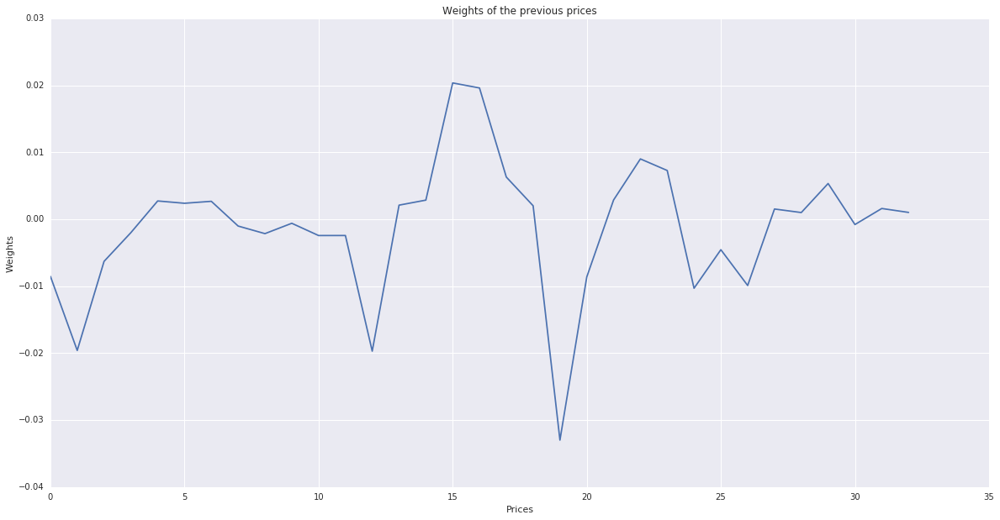

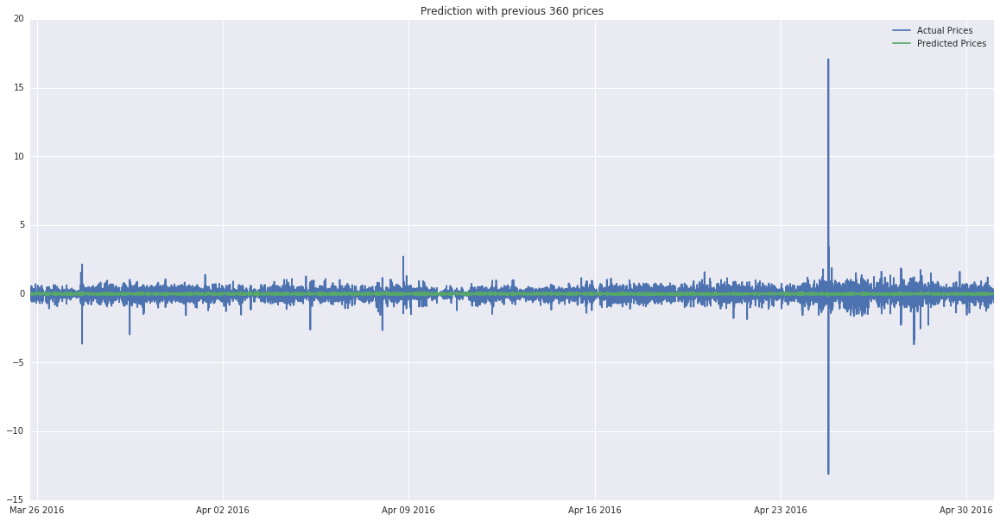

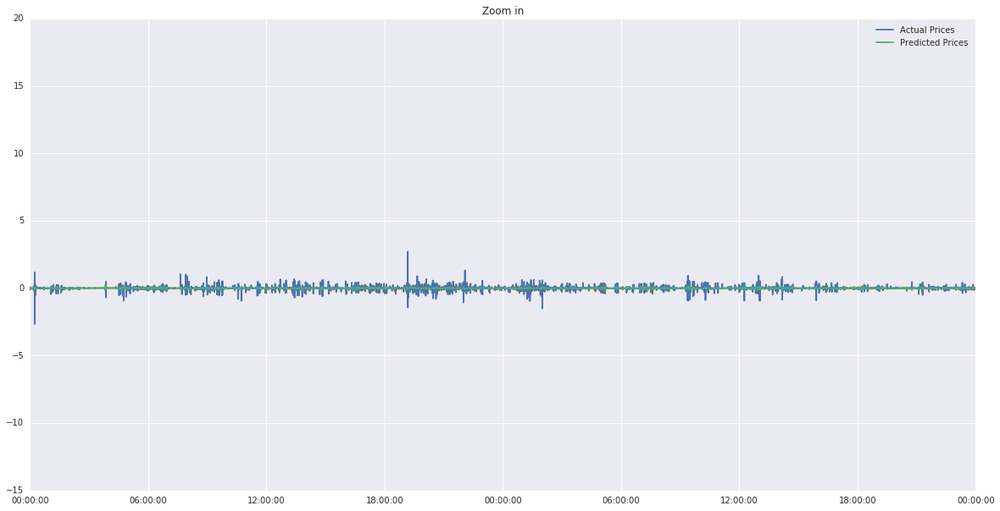

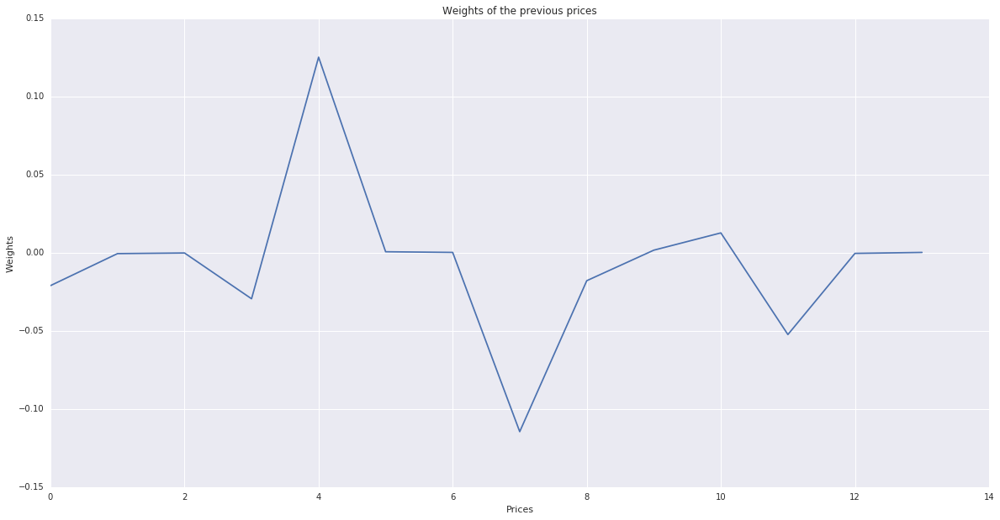

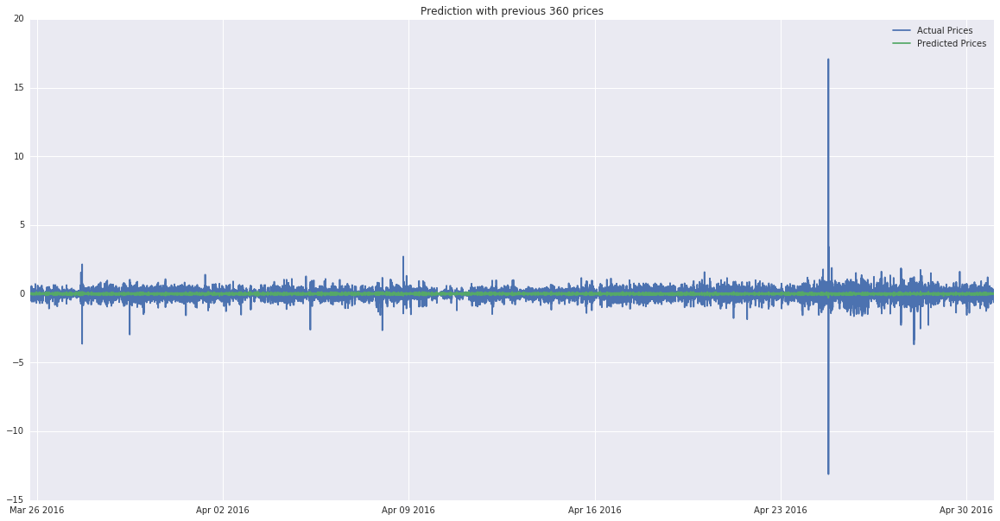

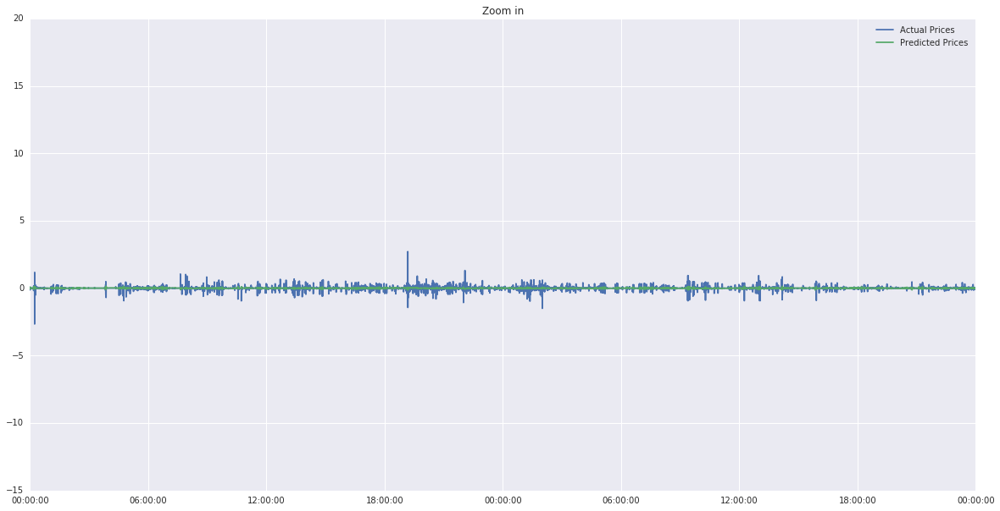

In [97]:
evaluate(datas[0].copy())

First training date:  2016-01-01 08:59:00
Last training date:  2016-03-25 20:11:00
First testing date:  2016-03-25 20:11:30
Last testing date:  2016-05-01 00:59:30


Results of prediction with all the technical indicators

Training set R2:  0.0200841015018 , Test set R2:  -0.00104820766722
Training set RMSE:  0.207939604021 , Test set RMSE:  0.153931632538
Training set MAE:  0.0967640366885 , Test set MAE:  0.0628155810537
Directional Symmetry:  0.54779055603 



['B-ASPREAD', 'K360', 'K180', 'K60', 'MOM60', 'ROC60', 'LWR360', 'LWR180', 'LWR60', 'ADOSC360', 'ADOSC180', 'ADOSC60', 'DISP360', 'RSI60'] 




Results of prediction with selected technical indicators

Training set R2:  0.0198062287735 , Test set R2:  -0.00110119757012
Training set RMSE:  0.207969084433 , Test set RMSE:  0.153935706624
Training set MAE:  0.0966893452521 , Test set MAE:  0.0626866793969
Directional Symmetry:  0.549574608899 





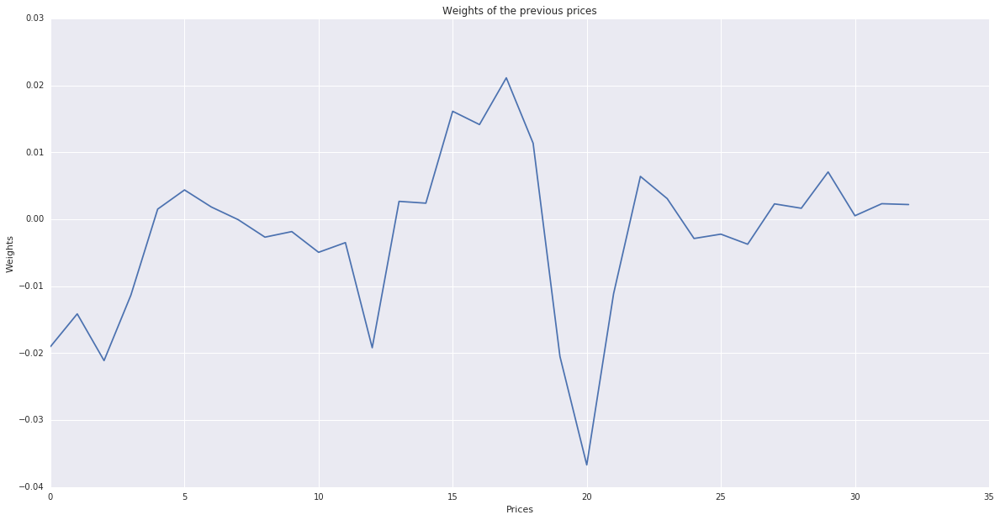

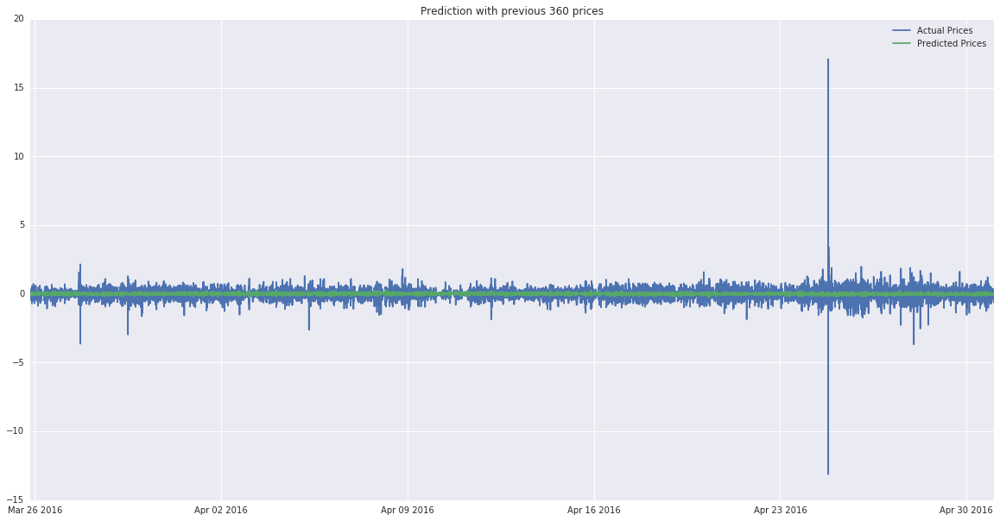

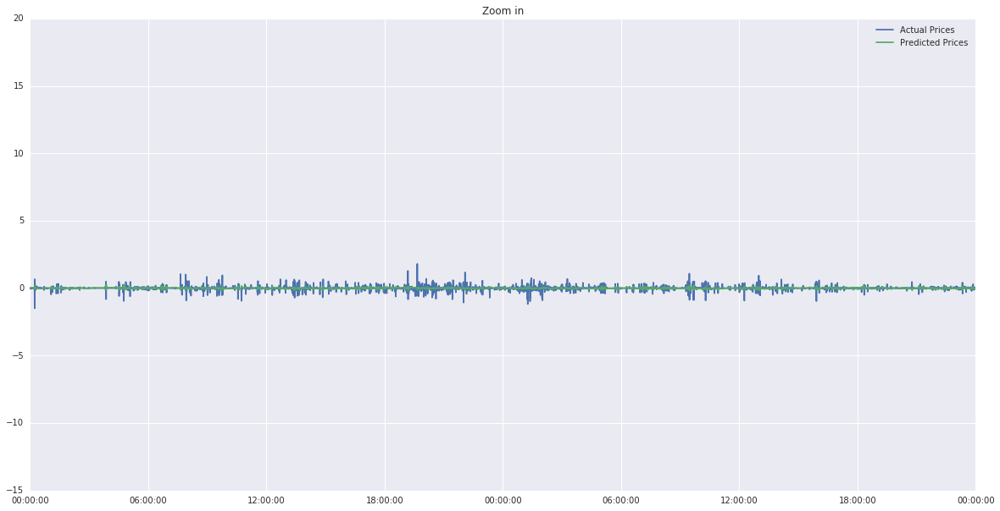

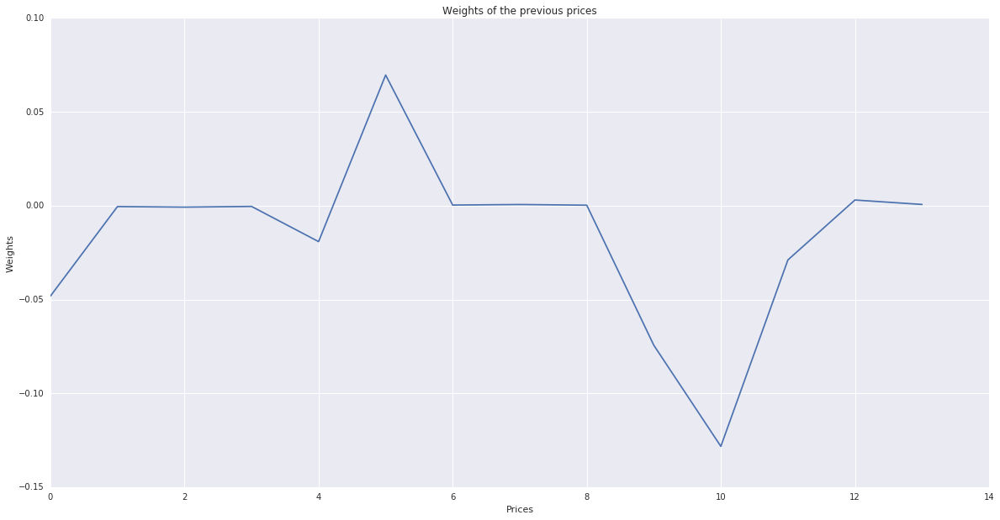

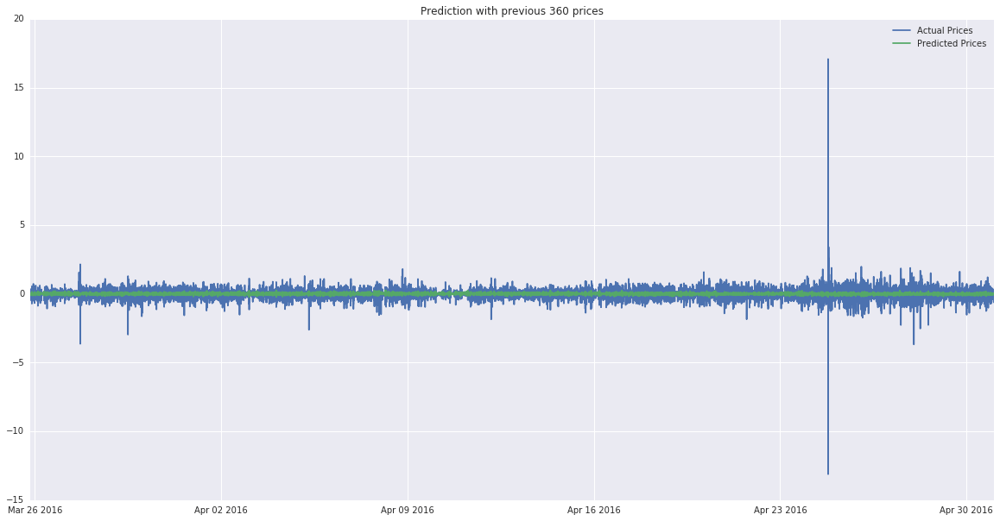

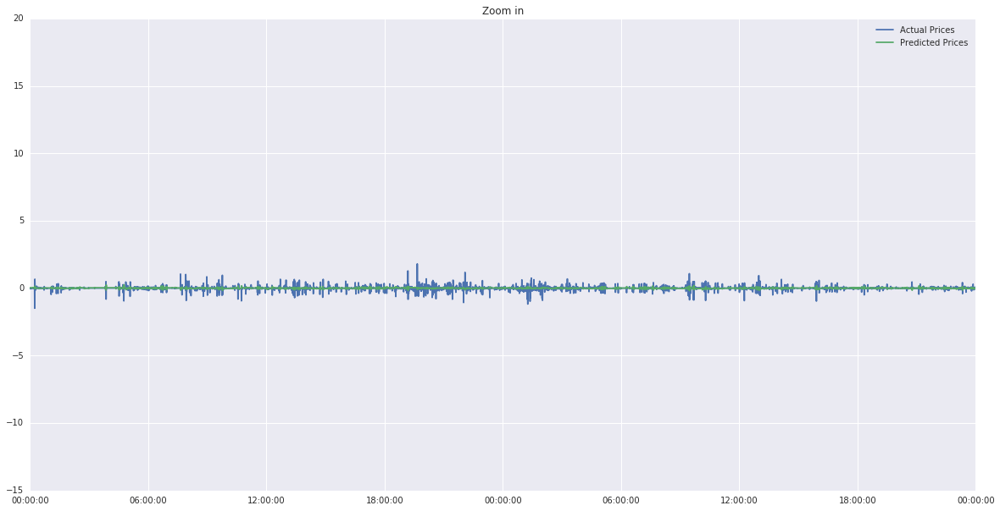

In [98]:
evaluate(datas[1].copy())

First training date:  2016-01-01 17:58:00
Last training date:  2016-03-25 22:52:00
First testing date:  2016-03-25 22:53:00
Last testing date:  2016-05-01 00:59:00


Results of prediction with all the technical indicators

Training set R2:  0.0166555936592 , Test set R2:  0.00481904183799
Training set RMSE:  0.277230382535 , Test set RMSE:  0.211005974842
Training set MAE:  0.142615018073 , Test set MAE:  0.0941610006821
Directional Symmetry:  0.554948332596 



['B-ASPREAD', 'K360', 'K180', 'K60', 'MOM180', 'MOM60', 'ROC360', 'ROC60', 'LWR360', 'LWR180', 'LWR60', 'ADOSC360', 'ADOSC180', 'ADOSC60', 'DISP360', 'OSCP180-360', 'RSI60'] 




Results of prediction with selected technical indicators

Training set R2:  0.0163886087109 , Test set R2:  0.00472721245128
Training set RMSE:  0.277268014984 , Test set RMSE:  0.211015709807
Training set MAE:  0.14253411501 , Test set MAE:  0.0940480289417
Directional Symmetry:  0.555275463275 





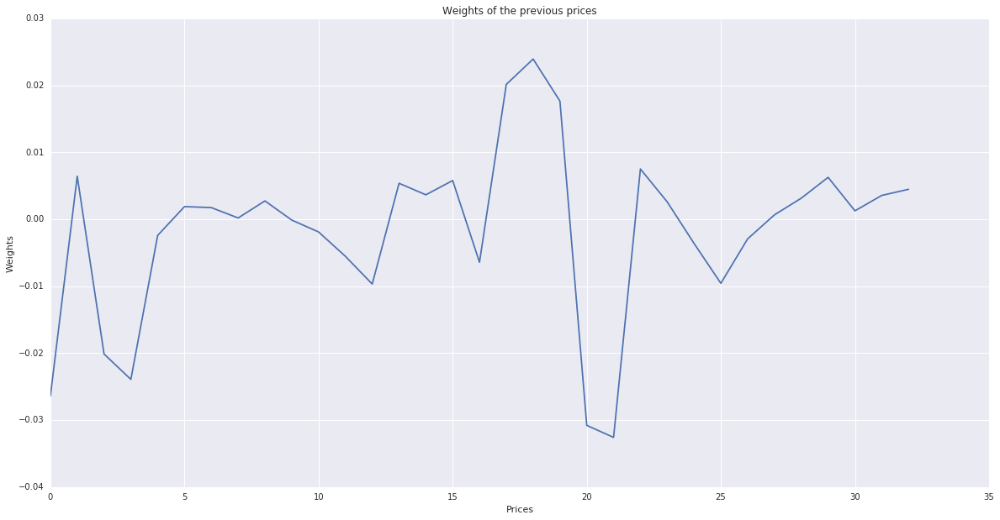

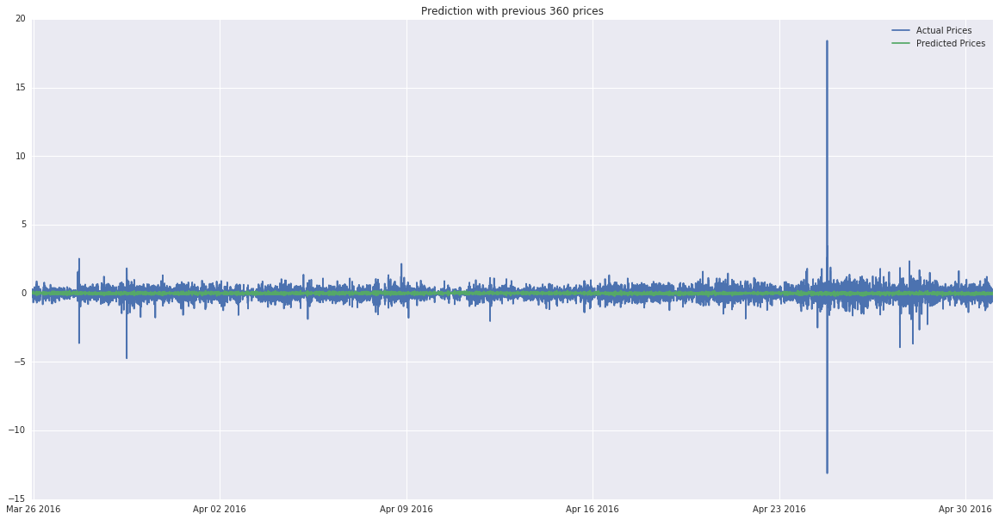

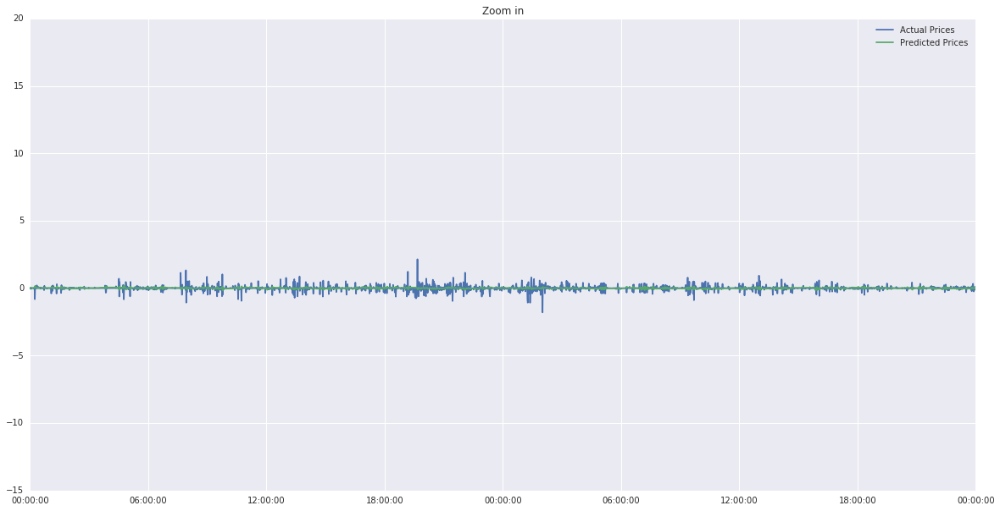

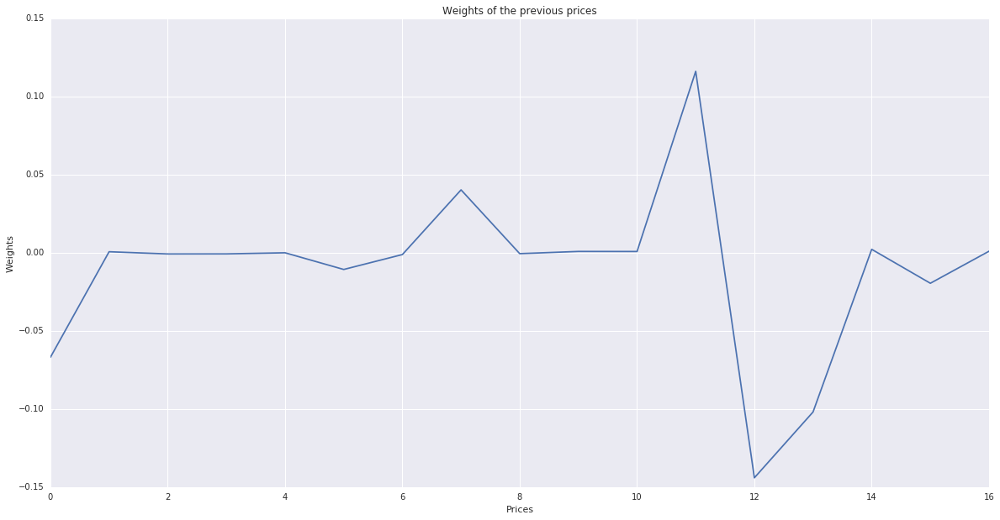

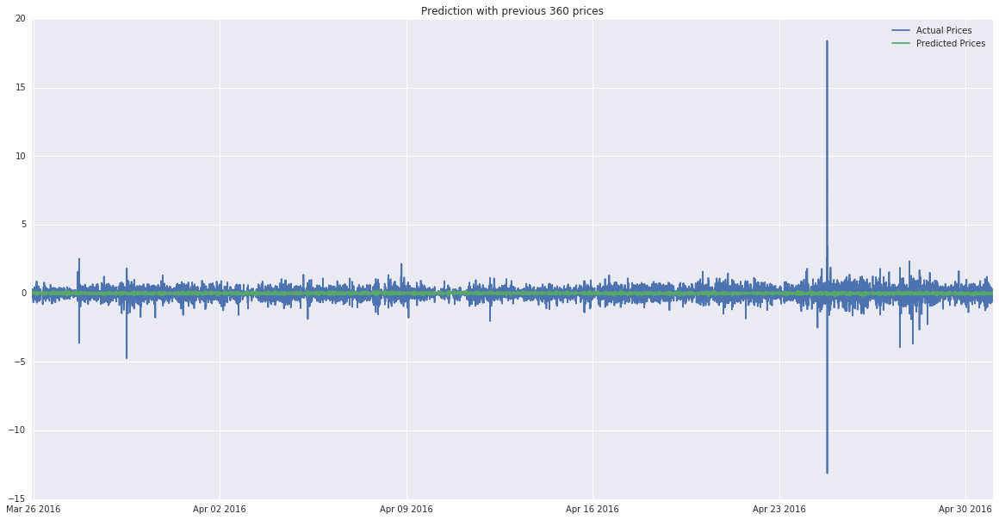

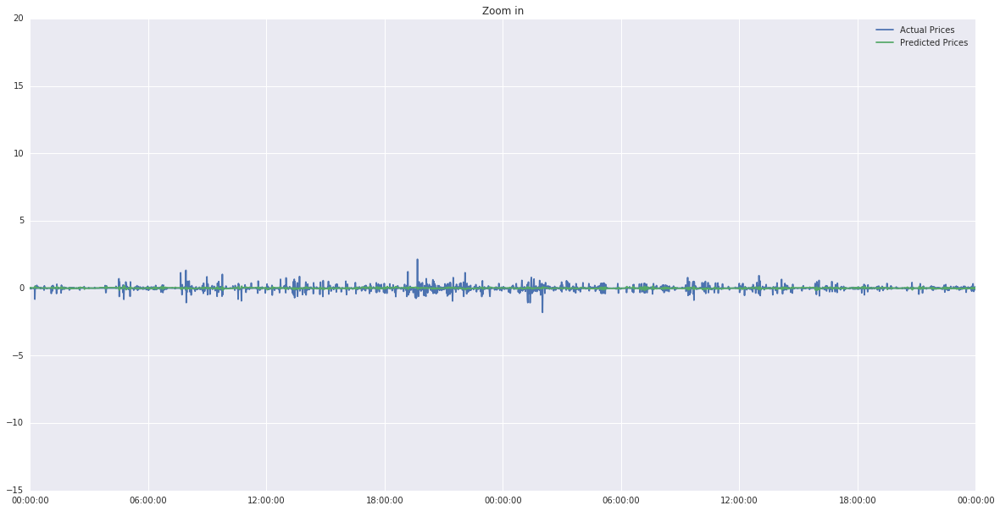

In [99]:
evaluate(datas[2].copy())

First training date:  2016-01-04 17:50:00
Last training date:  2016-03-26 20:20:00
First testing date:  2016-03-26 20:25:00
Last testing date:  2016-05-01 00:55:00


Results of prediction with all the technical indicators

Training set R2:  0.0114072045273 , Test set R2:  0.0110935829527
Training set RMSE:  0.591650484012 , Test set RMSE:  0.449255732267
Training set MAE:  0.339816270123 , Test set MAE:  0.231510530159
Directional Symmetry:  0.564676862358 



['B-ASPREAD', 'K360', 'K180', 'K60', 'D360', 'D180', 'sD360', 'sD180', 'sD60', 'MOM180', 'MOM60', 'ROC360', 'LWR360', 'LWR180', 'LWR60', 'ADOSC360', 'ADOSC180', 'ADOSC60', 'DISP60', 'OSCP180-360', 'RSI360', 'RSI60', 'CCI360', 'CCI180', 'CCI60'] 




Results of prediction with selected technical indicators

Training set R2:  0.011321784438 , Test set R2:  0.00932151605073
Training set RMSE:  0.591676044458 , Test set RMSE:  0.449658073111
Training set MAE:  0.340025592574 , Test set MAE:  0.231988377468
Directional Symmetry:  0.56

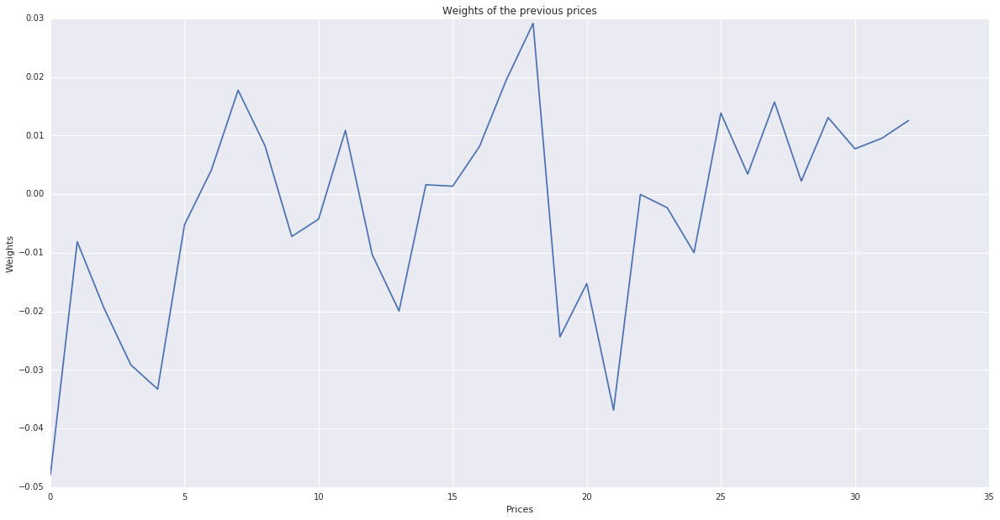

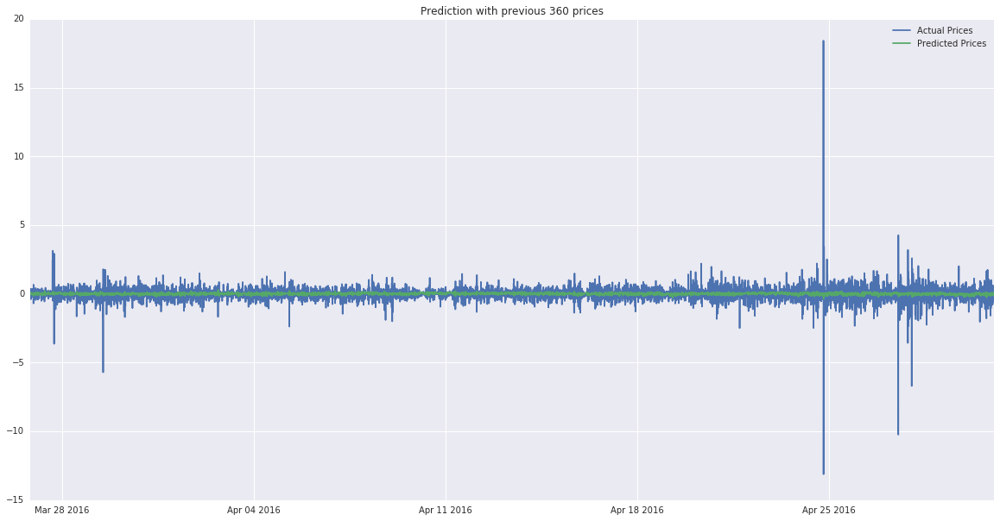

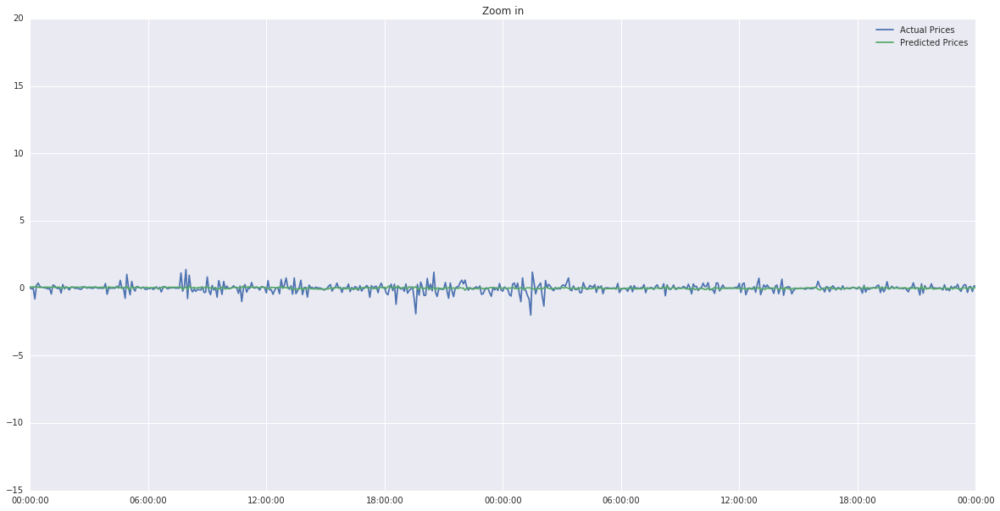

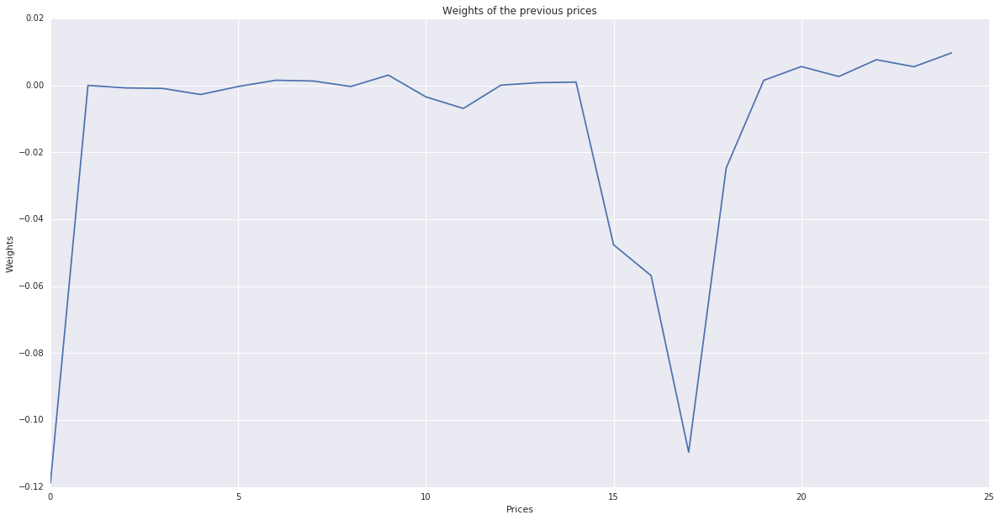

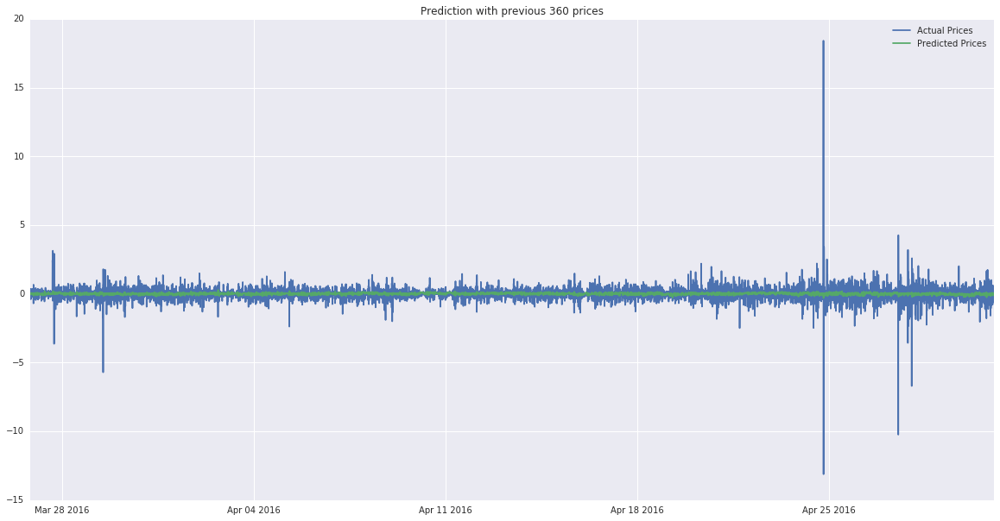

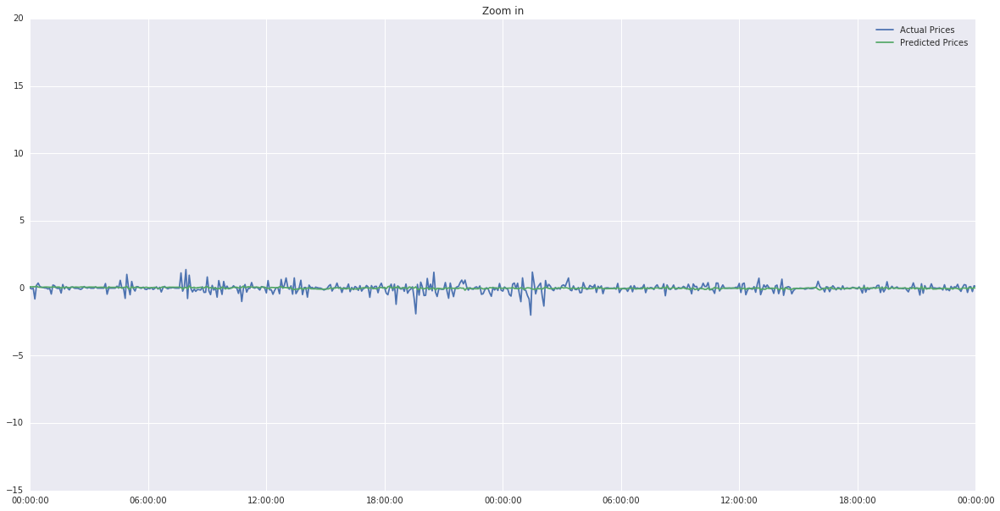

In [100]:
evaluate(datas[3].copy())

First training date:  2016-01-08 11:40:00
Last training date:  2016-03-27 23:10:00
First testing date:  2016-03-27 23:20:00
Last testing date:  2016-05-01 00:50:00


Results of prediction with all the technical indicators

Training set R2:  0.0146523327293 , Test set R2:  -0.00235873759858
Training set RMSE:  0.818622251196 , Test set RMSE:  0.535107934438
Training set MAE:  0.483000672788 , Test set MAE:  0.319828096765
Directional Symmetry:  0.540154912352 



['B-ASPREAD', 'K360', 'K180', 'K60', 'D180', 'D60', 'sD360', 'sD180', 'MOM360', 'MOM180', 'ROC360', 'ROC180', 'ROC60', 'LWR360', 'LWR180', 'LWR60', 'ADOSC360', 'ADOSC180', 'ADOSC60', 'DISP360', 'DISP180', 'DISP60', 'OSCP180-360', 'OSCP60-180', 'RSI360', 'RSI60', 'CCI180', 'CCI60'] 




Results of prediction with selected technical indicators

Training set R2:  0.0149548694063 , Test set R2:  -0.0081423301986
Training set RMSE:  0.818496568517 , Test set RMSE:  0.53664949571
Training set MAE:  0.483519923273 , Test set MAE:  0.3

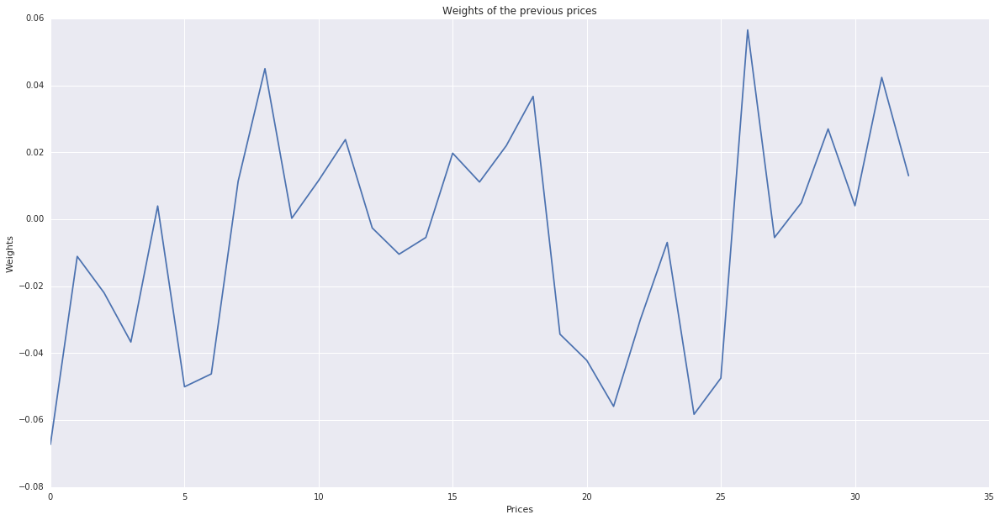

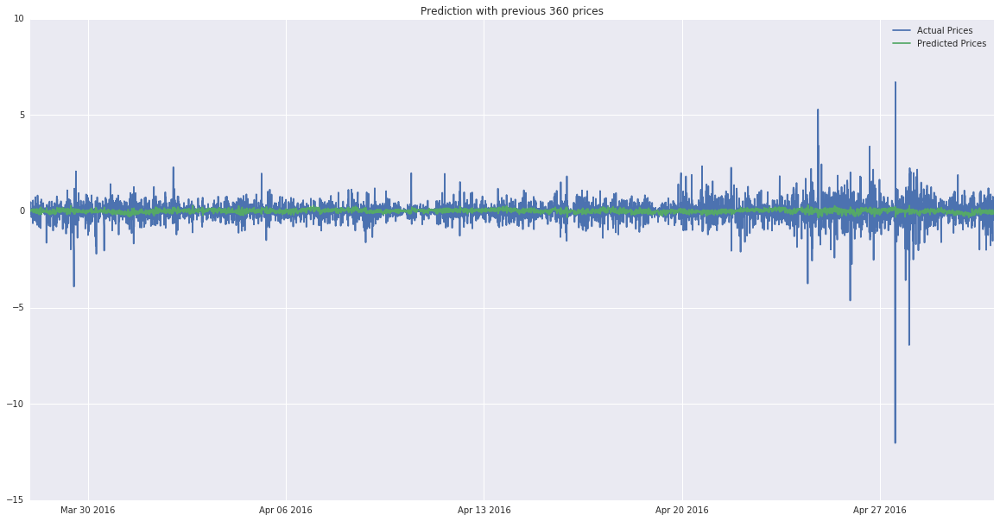

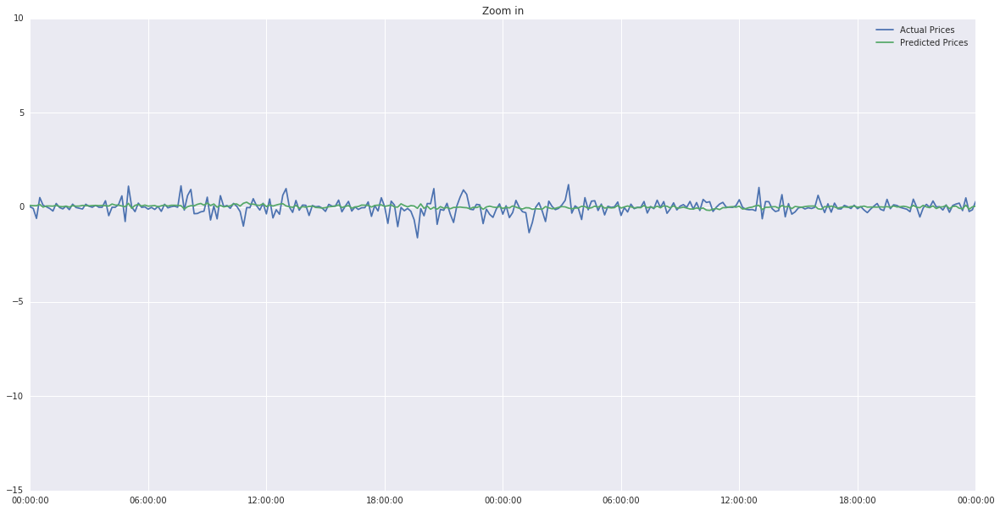

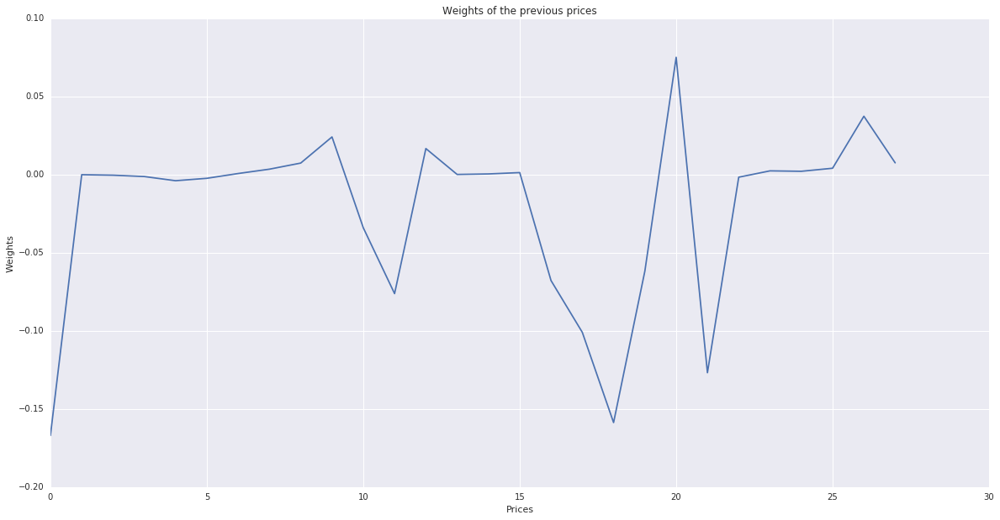

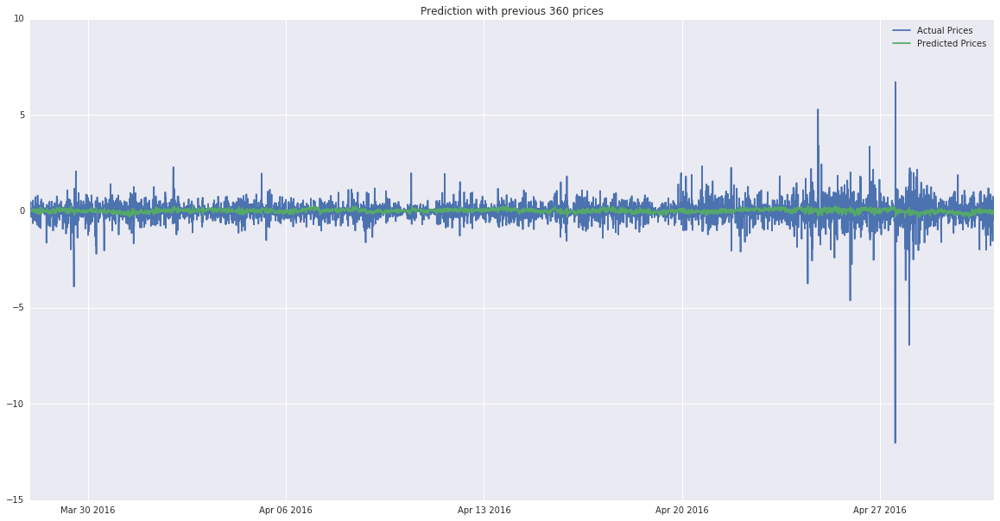

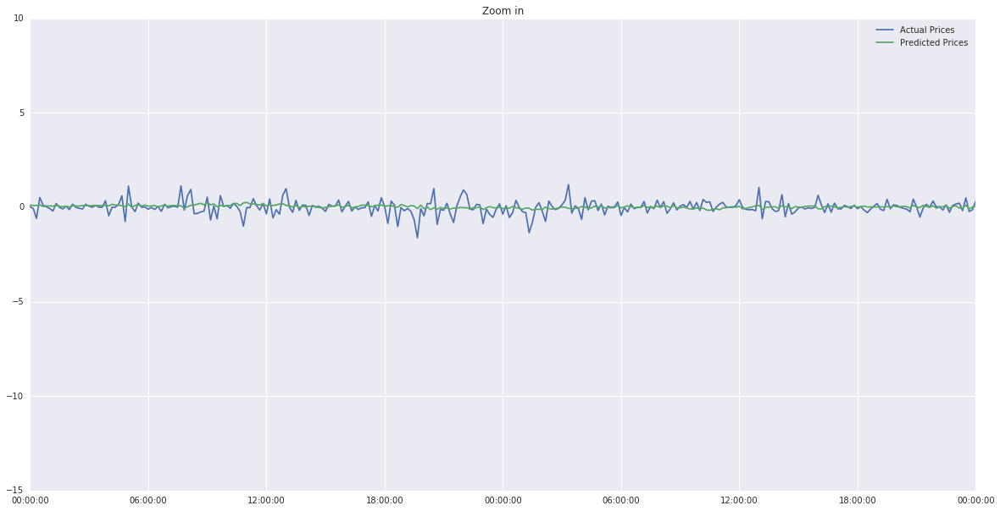

In [101]:
evaluate(datas[4].copy())

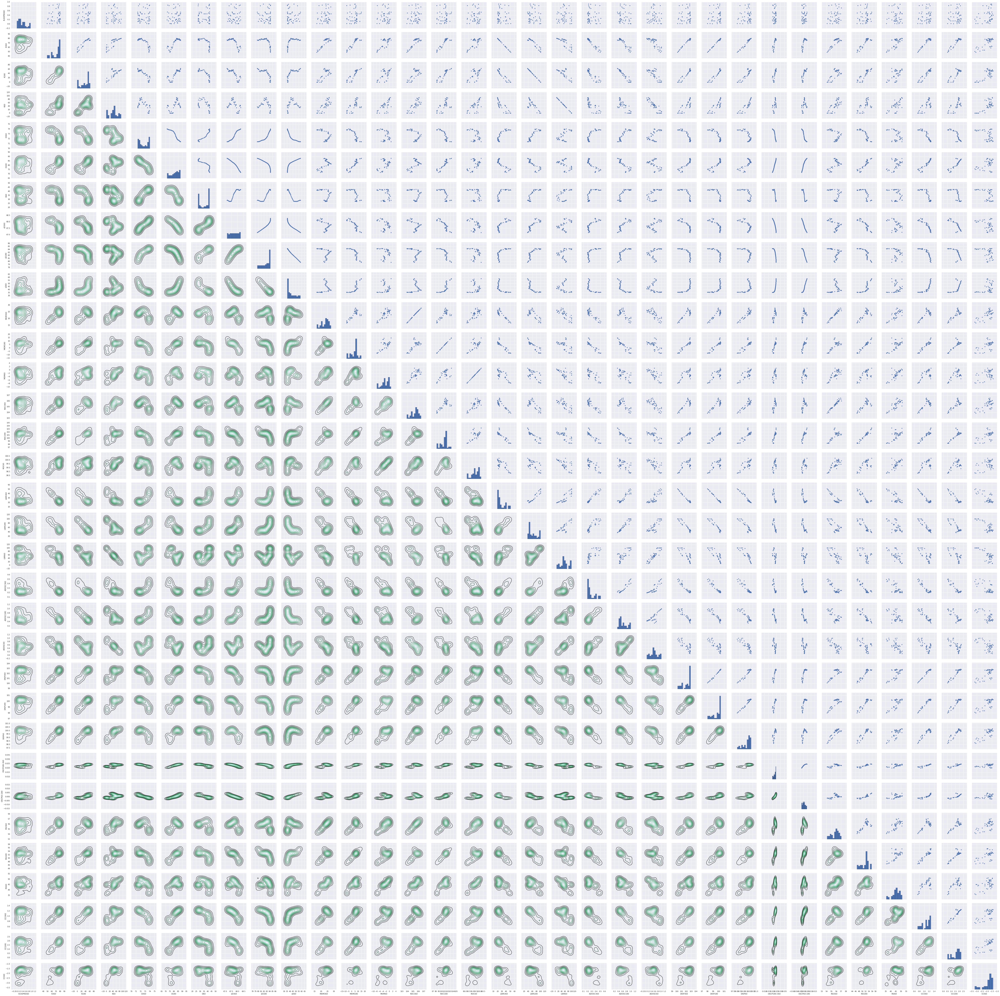

In [23]:
g = sns.PairGrid(datas[4][datas[4].drop(['mid price', 'DELTAP'], axis = 1).columns][:50])
g.map_upper(plt.scatter)
g.map_diag(plt.hist)
g.map_lower(sns.kdeplot)

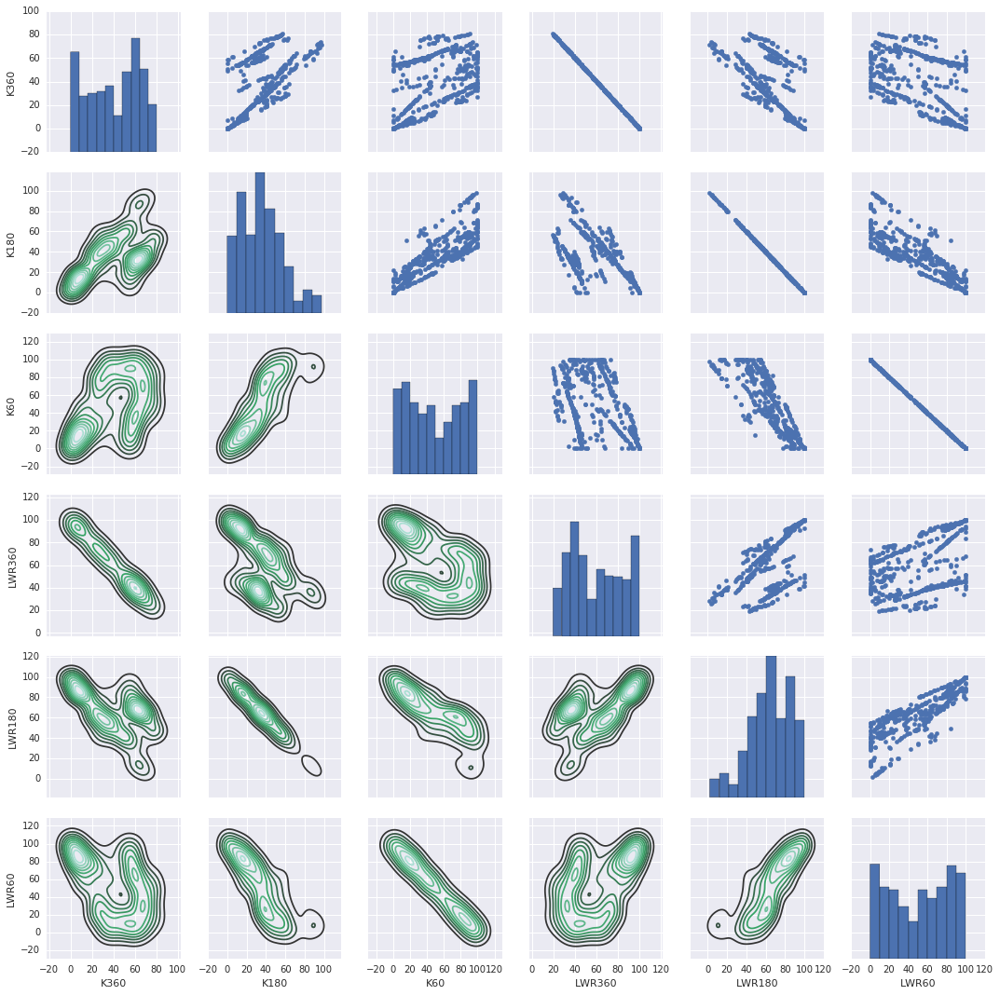

In [25]:
g = sns.PairGrid(datas[4][['K360','K180','K60','LWR360','LWR180','LWR60']][:500])
g.map_upper(plt.scatter)
g.map_diag(plt.hist)
g.map_lower(sns.kdeplot)

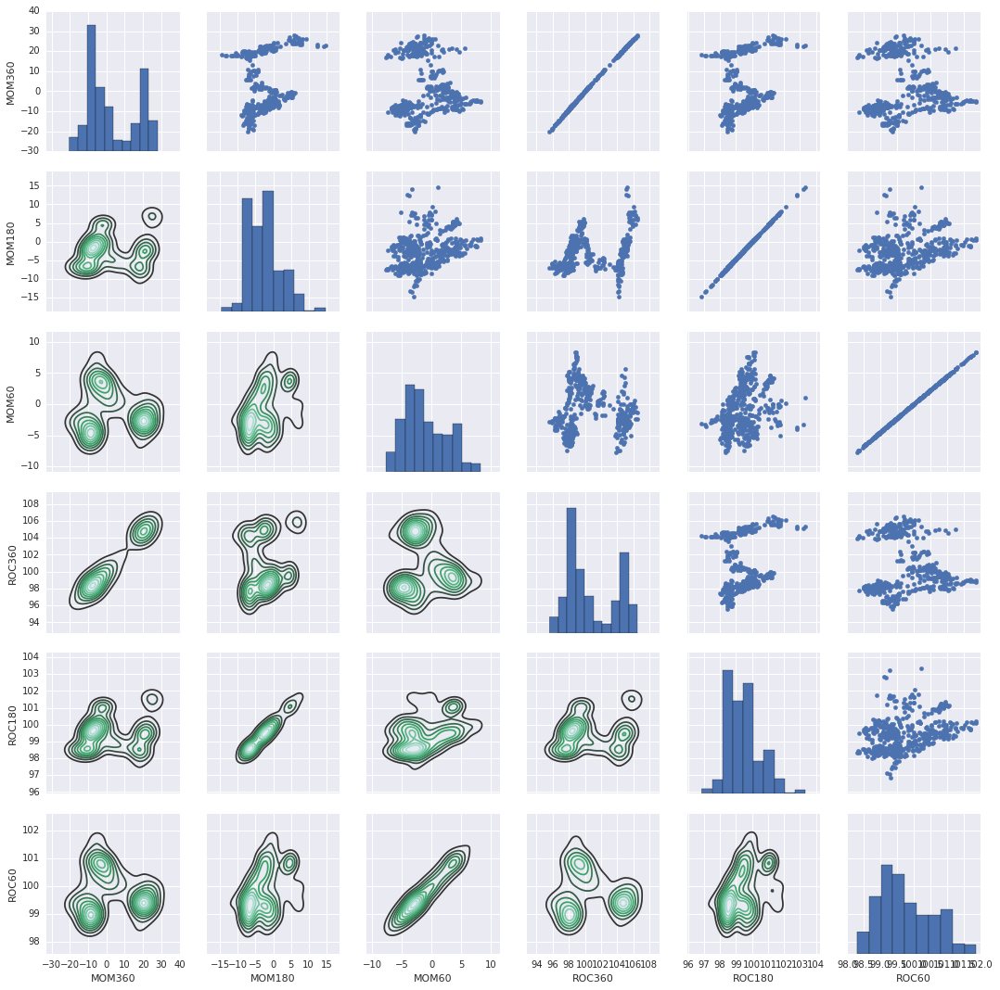

In [26]:
g = sns.PairGrid(datas[4][['MOM360','MOM180','MOM60','ROC360','ROC180','ROC60']][:500])
g.map_upper(plt.scatter)
g.map_diag(plt.hist)
g.map_lower(sns.kdeplot)